In [1]:
import pandas as pd
import numpy as np
cash_balance = pd.read_csv(r'/Users/stanislasbocearov/Desktop/home-credit-default-risk/POS_CASH_balance.csv')
bureau_balance = pd.read_csv(r'/Users/stanislasbocearov/Desktop/home-credit-default-risk/bureau_balance.csv')
credit_balance = pd.read_csv(r'/Users/stanislasbocearov/Desktop/home-credit-default-risk/credit_card_balance.csv')
app_test = pd.read_csv(r'/Users/stanislasbocearov/Desktop/home-credit-default-risk/application_test.csv')
installments_payments = pd.read_csv(r'/Users/stanislasbocearov/Desktop/home-credit-default-risk/installments_payments.csv')
app_train = pd.read_csv(r'/Users/stanislasbocearov/Desktop/home-credit-default-risk/application_train.csv')
previous_app = pd.read_csv(r'/Users/stanislasbocearov/Desktop/home-credit-default-risk/previous_application.csv')
bureau = pd.read_csv(r'/Users/stanislasbocearov/Desktop/home-credit-default-risk/bureau.csv')
sample_submission = pd.read_csv(r'/Users/stanislasbocearov/Desktop/home-credit-default-risk/sample_submission.csv')

# Cash Balance Dataset

In [2]:
cash_balance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


In [3]:
cash_balance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   SK_ID_PREV             int64  
 1   SK_ID_CURR             int64  
 2   MONTHS_BALANCE         int64  
 3   CNT_INSTALMENT         float64
 4   CNT_INSTALMENT_FUTURE  float64
 5   NAME_CONTRACT_STATUS   object 
 6   SK_DPD                 int64  
 7   SK_DPD_DEF             int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB


In [4]:
cash_balance.describe()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,SK_DPD,SK_DPD_DEF
count,1.000136e+07,1.000136e+07,1.000136e+07,9.975287e+06,9.975271e+06,1.000136e+07,1.000136e+07
mean,1.903217e+06,2.784039e+05,-3.501259e+01,1.708965e+01,1.048384e+01,1.160693e+01,6.544684e-01
std,5.358465e+05,1.027637e+05,2.606657e+01,1.199506e+01,1.110906e+01,1.327140e+02,3.276249e+01
min,1.000001e+06,1.000010e+05,-9.600000e+01,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.434405e+06,1.895500e+05,-5.400000e+01,1.000000e+01,3.000000e+00,0.000000e+00,0.000000e+00
50%,1.896565e+06,2.786540e+05,-2.800000e+01,1.200000e+01,7.000000e+00,0.000000e+00,0.000000e+00
75%,2.368963e+06,3.674290e+05,-1.300000e+01,2.400000e+01,1.400000e+01,0.000000e+00,0.000000e+00
max,2.843499e+06,4.562550e+05,-1.000000e+00,9.200000e+01,8.500000e+01,4.231000e+03,3.595000e+03


In [5]:
cash_balance.isnull().sum()

SK_ID_PREV                   0
SK_ID_CURR                   0
MONTHS_BALANCE               0
CNT_INSTALMENT           26071
CNT_INSTALMENT_FUTURE    26087
NAME_CONTRACT_STATUS         0
SK_DPD                       0
SK_DPD_DEF                   0
dtype: int64

In [6]:
cash_balance.nunique()

SK_ID_PREV               936325
SK_ID_CURR               337252
MONTHS_BALANCE               96
CNT_INSTALMENT               73
CNT_INSTALMENT_FUTURE        79
NAME_CONTRACT_STATUS          9
SK_DPD                     3400
SK_DPD_DEF                 2307
dtype: int64

Text(0, 0.5, 'Status of the contract')

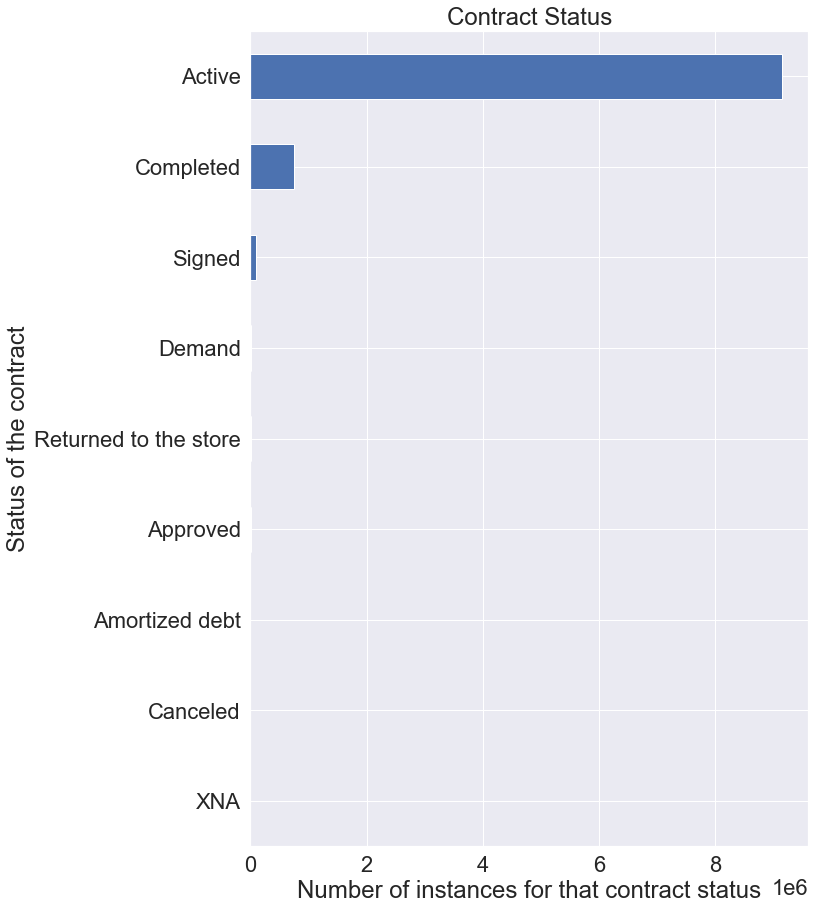

In [7]:
#only interested in active?
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(font_scale=2)
cash_balance['NAME_CONTRACT_STATUS'].value_counts().sort_values().plot(kind='barh', figsize=[10,15], title = 'Contract Status')
plt.xlabel("Number of instances for that contract status")
plt.ylabel("Status of the contract")

In [8]:
cash_balance["MONTHS_BALANCE"].max()

-1

In [9]:
cash_balance["MONTHS_BALANCE"].min()

-96

Text(0, 0.5, 'amount of counts instalments')

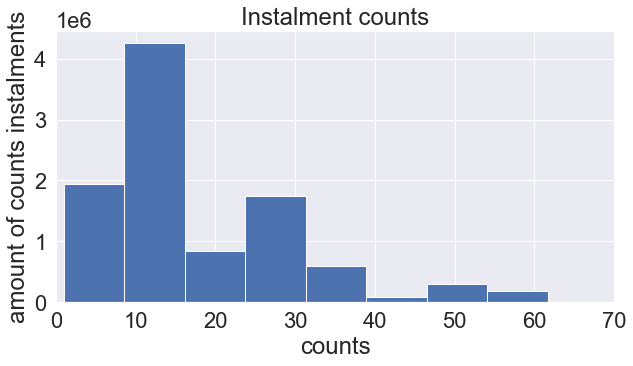

In [10]:
cash_balance["CNT_INSTALMENT"].hist(bins=12, figsize=(10, 5))
plt.xlim([0, 70])
plt.title("Instalment counts")
plt.xlabel('counts')
plt.ylabel('amount of counts instalments')

In [11]:
np.any(cash_balance['SK_ID_PREV'].duplicated())

True

In [12]:
np.any(cash_balance['SK_ID_CURR'].duplicated())

True

# Bureau balance dataset

In [13]:
bureau_balance.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [14]:
bureau_balance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    int64 
 1   MONTHS_BALANCE  int64 
 2   STATUS          object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB


In [15]:
bureau_balance.describe()

,SK_ID_BUREAU,MONTHS_BALANCE
count,2.729992e+07,2.729992e+07
mean,6.036297e+06,-3.074169e+01
std,4.923489e+05,2.386451e+01
min,5.001709e+06,-9.600000e+01
25%,5.730933e+06,-4.600000e+01
50%,6.070821e+06,-2.500000e+01
75%,6.431951e+06,-1.100000e+01
max,6.842888e+06,0.000000e+00


In [16]:
bureau_balance.isnull().sum()

SK_ID_BUREAU      0
MONTHS_BALANCE    0
STATUS            0
dtype: int64

In [17]:
np.any(bureau_balance['SK_ID_BUREAU'].duplicated())

True

Text(0, 0.5, 'amount of months')

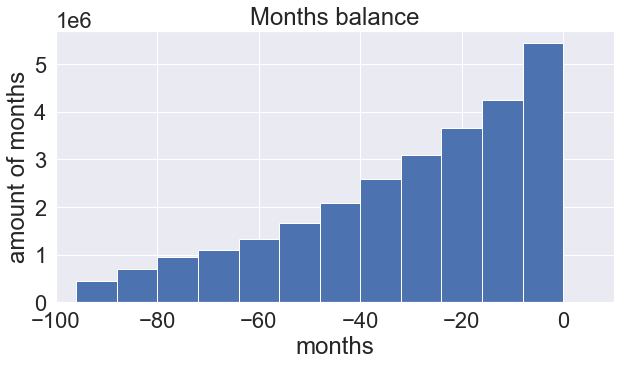

In [18]:
bureau_balance["MONTHS_BALANCE"].hist(bins=12, figsize=(10, 5))
plt.xlim([-100, 10])
plt.title("Months balance")
plt.xlabel('months')
plt.ylabel('amount of months')

'Status of Credit Bureau loan during the month (active, closed, DPD0-30,�\n[C means closed, X means status unknown, 0 means no DPD, 1 means maximal did during month between \n1-30, 2 means DPD 31-60,� 5 means DPD 120+ or sold or written off ] )'

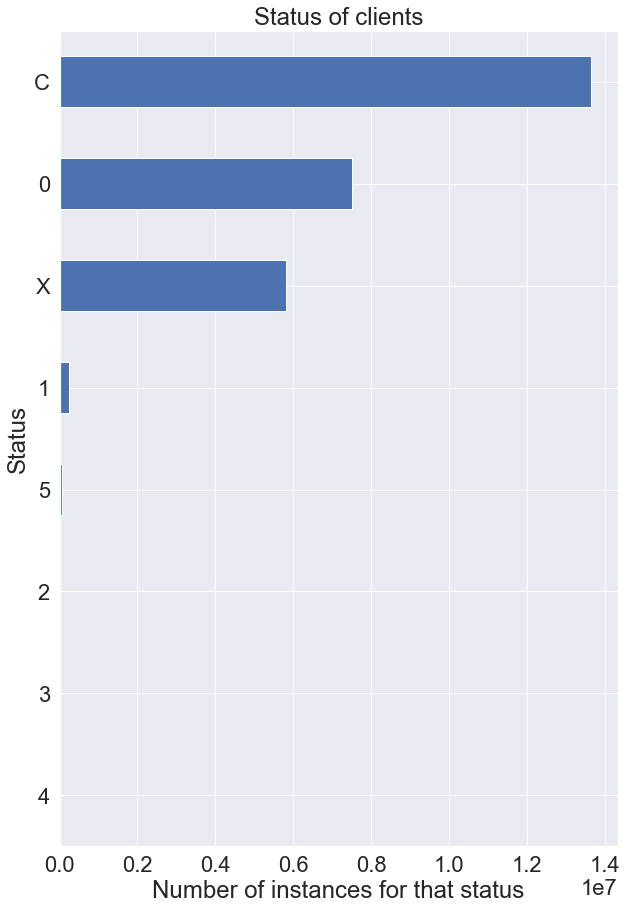

In [19]:
bureau_balance['STATUS'].value_counts().sort_values().plot(kind='barh', figsize=[10,15], title = 'Status of clients')
plt.xlabel("Number of instances for that status")
plt.ylabel("Status")
'''Status of Credit Bureau loan during the month (active, closed, DPD0-30,�
[C means closed, X means status unknown, 0 means no DPD, 1 means maximal did during month between 
1-30, 2 means DPD 31-60,� 5 means DPD 120+ or sold or written off ] )'''

# Credit balance dataset

In [20]:
credit_balance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


(0.0, 1000000.0)

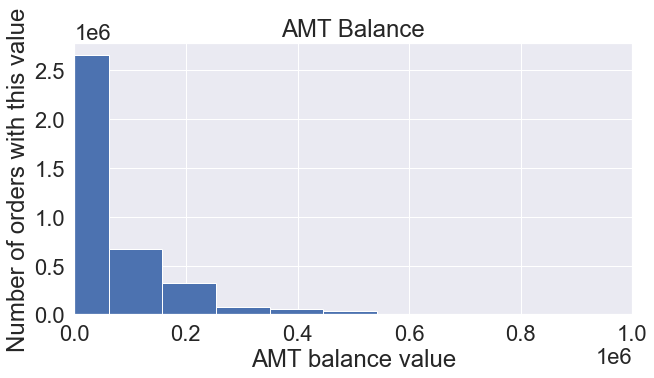

In [21]:
credit_balance["AMT_BALANCE"].hist(bins=20, figsize=(10, 5))
plt.title("AMT Balance")
plt.xlabel("AMT balance value")
plt.ylabel("Number of orders with this value")
plt.xlim([0, 1000000])

(0.0, 1000000.0)

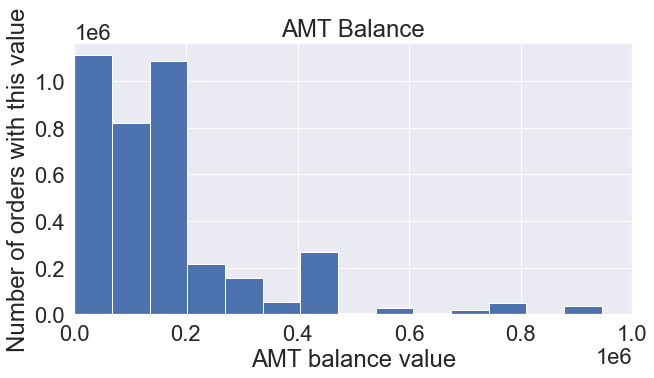

In [22]:
credit_balance["AMT_CREDIT_LIMIT_ACTUAL"].hist(bins=20, figsize=(10, 5))
plt.title("AMT Balance")
plt.xlabel("AMT balance value")
plt.ylabel("Number of orders with this value")
plt.xlim([0, 1000000])

(0.0, 500000.0)

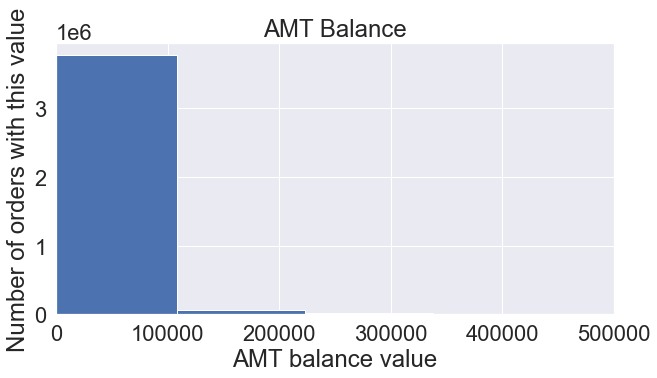

In [23]:
credit_balance["AMT_DRAWINGS_CURRENT"].hist(bins=20, figsize=(10, 5))
plt.title("AMT Balance")
plt.xlabel("AMT balance value")
plt.ylabel("Number of orders with this value")
plt.xlim([0, 500000])

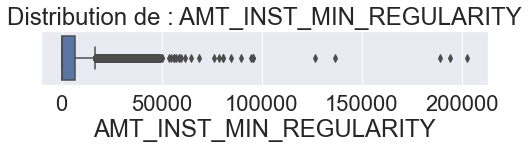

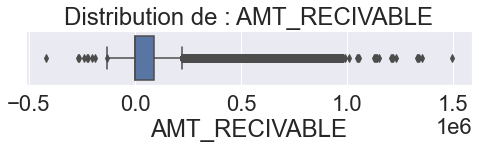

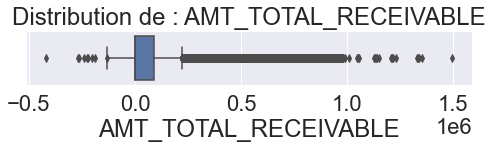

In [24]:
var_to_hist = ['AMT_INST_MIN_REGULARITY', 'AMT_RECIVABLE', 'AMT_TOTAL_RECEIVABLE']
for column in var_to_hist:
    plt.figure(figsize = (8,1))
    
    sns.boxplot(x=credit_balance[column])
    chaine = 'Distribution de : ' + column
    plt.title(chaine)
    plt.xlabel(column)
    plt.show()

Text(0, 0.5, 'Status')

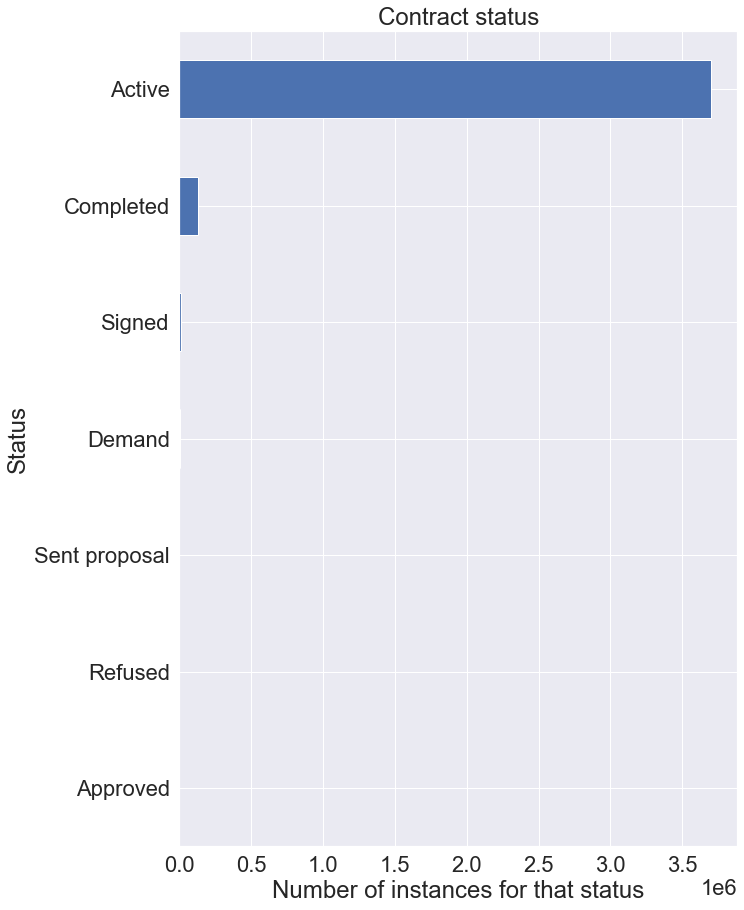

In [25]:
credit_balance['NAME_CONTRACT_STATUS'].value_counts().sort_values().plot(kind='barh', figsize=[10,15], title = 'Contract status')
plt.xlabel("Number of instances for that status")
plt.ylabel("Status")

In [26]:
credit_balance.isnull().sum()

SK_ID_PREV                         0
SK_ID_CURR                         0
MONTHS_BALANCE                     0
AMT_BALANCE                        0
AMT_CREDIT_LIMIT_ACTUAL            0
AMT_DRAWINGS_ATM_CURRENT      749816
AMT_DRAWINGS_CURRENT               0
AMT_DRAWINGS_OTHER_CURRENT    749816
AMT_DRAWINGS_POS_CURRENT      749816
AMT_INST_MIN_REGULARITY       305236
AMT_PAYMENT_CURRENT           767988
AMT_PAYMENT_TOTAL_CURRENT          0
AMT_RECEIVABLE_PRINCIPAL           0
AMT_RECIVABLE                      0
AMT_TOTAL_RECEIVABLE               0
CNT_DRAWINGS_ATM_CURRENT      749816
CNT_DRAWINGS_CURRENT               0
CNT_DRAWINGS_OTHER_CURRENT    749816
CNT_DRAWINGS_POS_CURRENT      749816
CNT_INSTALMENT_MATURE_CUM     305236
NAME_CONTRACT_STATUS               0
SK_DPD                             0
SK_DPD_DEF                         0
dtype: int64

# App test dataset


In [27]:
app_test.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


# Installments_payments

In [28]:
installments_payments.head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


(0.0, 150.0)

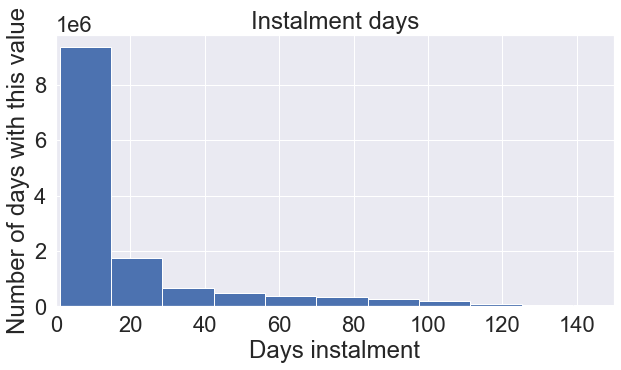

In [29]:
installments_payments['NUM_INSTALMENT_NUMBER'].hist(bins=20, figsize=(10, 5))
plt.title("Instalment days")
plt.xlabel("Days instalment")
plt.ylabel("Number of days with this value")
plt.xlim([0, 150])

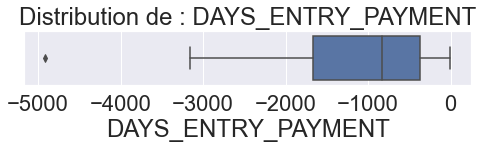

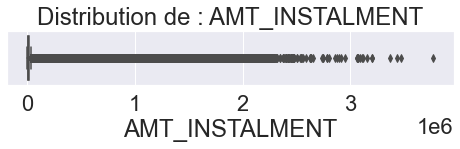

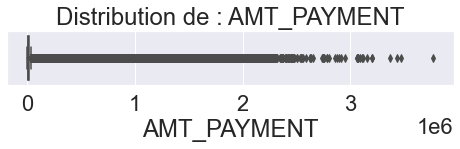

In [30]:
var_to_hist = ['DAYS_ENTRY_PAYMENT', 'AMT_INSTALMENT', 'AMT_PAYMENT']
for column in var_to_hist:
    plt.figure(figsize = (8,1))
    
    sns.boxplot(x=installments_payments[column])
    chaine = 'Distribution de : ' + column
    plt.title(chaine)
    plt.xlabel(column)
    plt.show()

In [31]:
installments_payments.isnull().sum()

SK_ID_PREV                   0
SK_ID_CURR                   0
NUM_INSTALMENT_VERSION       0
NUM_INSTALMENT_NUMBER        0
DAYS_INSTALMENT              0
DAYS_ENTRY_PAYMENT        2905
AMT_INSTALMENT               0
AMT_PAYMENT               2905
dtype: int64

# App_train dataset

In [32]:
app_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [33]:
app_train['TARGET']

0         1
1         0
2         0
3         0
4         0
         ..
307506    0
307507    0
307508    0
307509    1
307510    0
Name: TARGET, Length: 307511, dtype: int64

Text(0, 0.5, 'Type of contract')

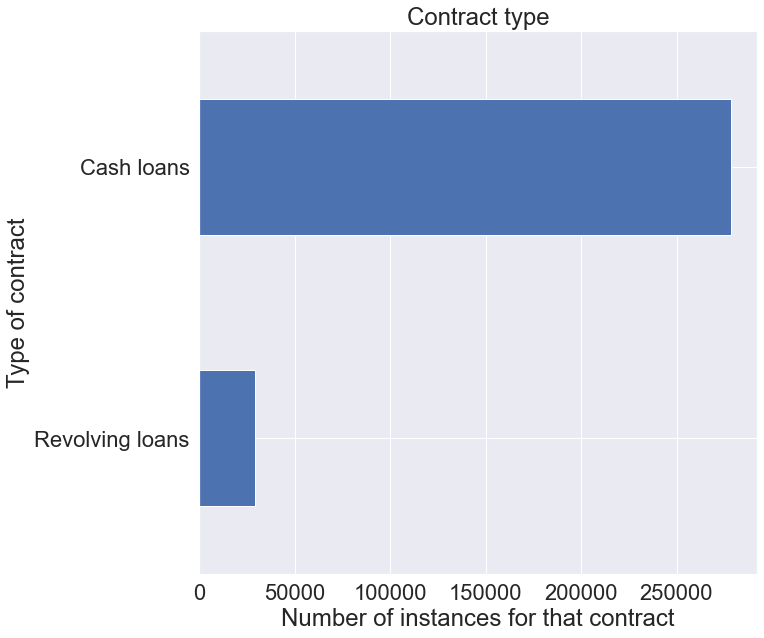

In [34]:
app_train['NAME_CONTRACT_TYPE'].value_counts().sort_values().plot(kind='barh', figsize=[10,10], title = 'Contract type')
plt.xlabel("Number of instances for that contract")
plt.ylabel("Type of contract")

# Previous_app dataset

In [35]:
previous_app.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


# Bureau dataset

In [36]:
bureau.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [37]:
bureau['CREDIT_ACTIVE']

0          Closed
1          Active
2          Active
3          Active
4          Active
            ...  
1716423    Active
1716424    Closed
1716425    Closed
1716426    Closed
1716427    Closed
Name: CREDIT_ACTIVE, Length: 1716428, dtype: object

In [38]:
bureau['CREDIT_ACTIVE'].nunique()

4

Text(0, 0.5, 'Status')

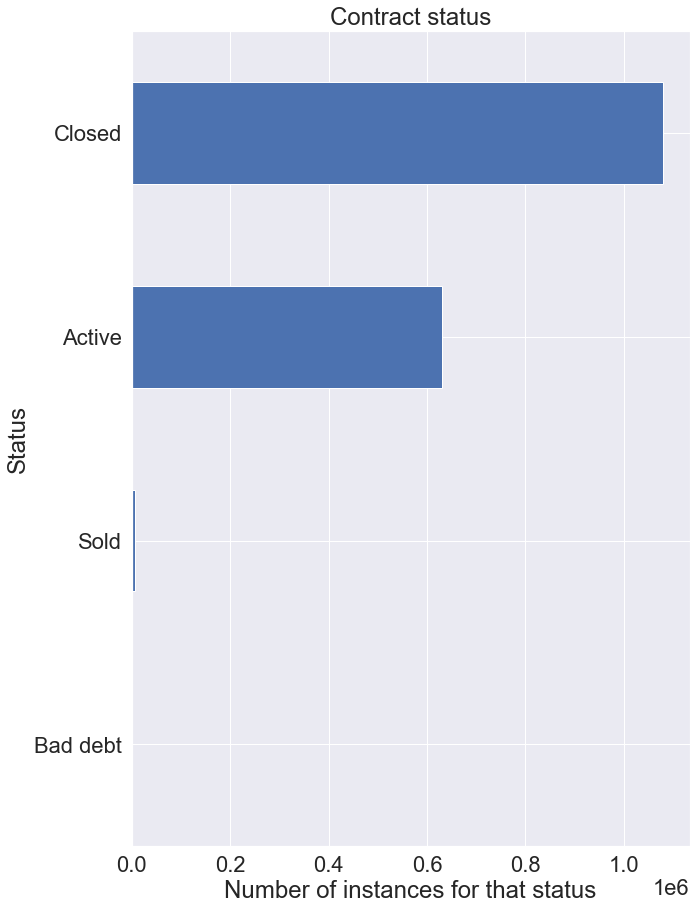

In [39]:
bureau['CREDIT_ACTIVE'].value_counts().sort_values().plot(kind='barh', figsize=[10,15], title = 'Contract status')
plt.xlabel("Number of instances for that status")
plt.ylabel("Status")

Text(0, 0.5, 'Status')

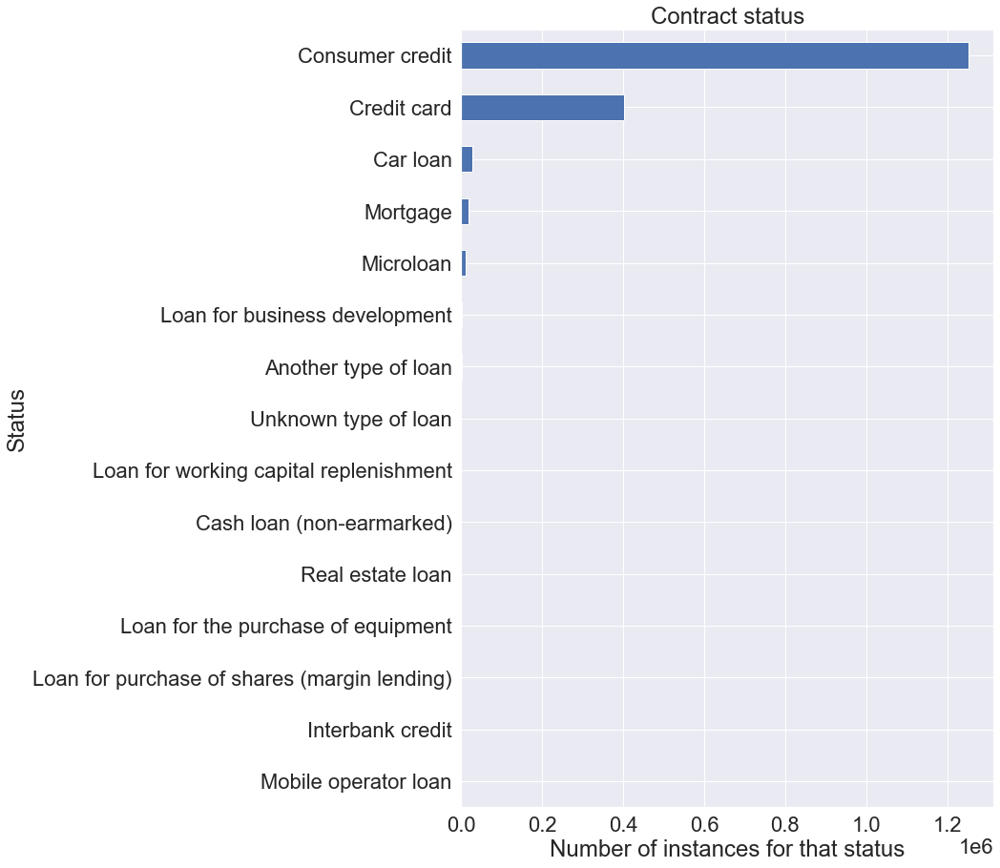

In [40]:
bureau['CREDIT_TYPE'].value_counts().sort_values().plot(kind='barh', figsize=[10,15], title = 'Contract status')
plt.xlabel("Number of instances for that status")
plt.ylabel("Status")

Text(0, 0.5, 'Status')

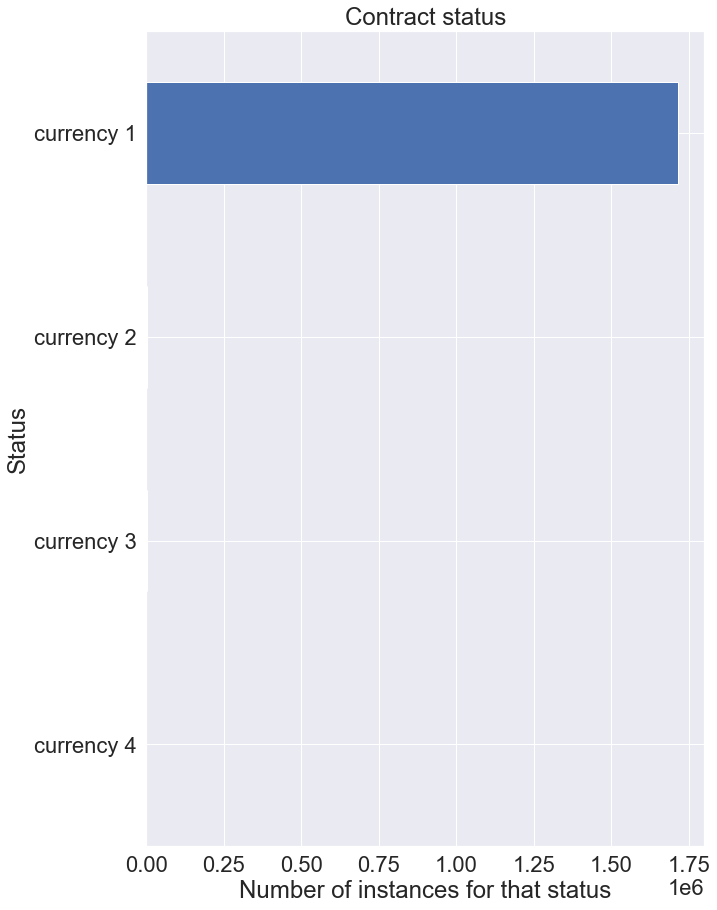

In [41]:
bureau['CREDIT_CURRENCY'].value_counts().sort_values().plot(kind='barh', figsize=[10,15], title = 'Contract status')
plt.xlabel("Number of instances for that status")
plt.ylabel("Status")

In [42]:
bureau.isnull().sum()

SK_ID_CURR                      0
SK_ID_BUREAU                    0
CREDIT_ACTIVE                   0
CREDIT_CURRENCY                 0
DAYS_CREDIT                     0
CREDIT_DAY_OVERDUE              0
DAYS_CREDIT_ENDDATE        105553
DAYS_ENDDATE_FACT          633653
AMT_CREDIT_MAX_OVERDUE    1124488
CNT_CREDIT_PROLONG              0
AMT_CREDIT_SUM                 13
AMT_CREDIT_SUM_DEBT        257669
AMT_CREDIT_SUM_LIMIT       591780
AMT_CREDIT_SUM_OVERDUE          0
CREDIT_TYPE                     0
DAYS_CREDIT_UPDATE              0
AMT_ANNUITY               1226791
dtype: int64

# Sample_submission dataset

In [43]:
sample_submission.head()

,SK_ID_CURR,TARGET
0,100001,0.5
1,100005,0.5
2,100013,0.5
3,100028,0.5
4,100038,0.5


In [44]:
sample_submission['TARGET'].nunique()

1

In [45]:
sample_submission.isnull().sum()

SK_ID_CURR    0
TARGET        0
dtype: int64

# Cleaning

In [46]:
app_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [47]:
app_train.shape

(307511, 122)

In [48]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
app_train.isnull().sum()

SK_ID_CURR                           0
TARGET                               0
NAME_CONTRACT_TYPE                   0
CODE_GENDER                          0
FLAG_OWN_CAR                         0
FLAG_OWN_REALTY                      0
CNT_CHILDREN                         0
AMT_INCOME_TOTAL                     0
AMT_CREDIT                           0
AMT_ANNUITY                         12
AMT_GOODS_PRICE                    278
NAME_TYPE_SUITE                   1292
NAME_INCOME_TYPE                     0
NAME_EDUCATION_TYPE                  0
NAME_FAMILY_STATUS                   0
NAME_HOUSING_TYPE                    0
REGION_POPULATION_RELATIVE           0
DAYS_BIRTH                           0
DAYS_EMPLOYED                        0
DAYS_REGISTRATION                    0
DAYS_ID_PUBLISH                      0
OWN_CAR_AGE                     202929
FLAG_MOBIL                           0
FLAG_EMP_PHONE                       0
FLAG_WORK_PHONE                      0
FLAG_CONT_MOBILE         

### For our baseline model, we will be using all features that we think could be useful for this project without thinking of ethic 

In [49]:
#document, extsource
columns_to_keep = ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 
                   'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
                   'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 
                   'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 
                   'DAYS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'REGION_RATING_CLIENT', 
                   'REGION_RATING_CLIENT_W_CITY', 'ORGANIZATION_TYPE', 'TARGET', 'EXT_SOURCE_2', 
                   'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK', 
                   'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR', 
                   'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 
                   'DEF_60_CNT_SOCIAL_CIRCLE']

In [50]:
df = app_train[columns_to_keep]

In [51]:
print(app_train.columns.tolist())

['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELE

In [52]:
df.shape

(307511, 36)

In [53]:
df.isnull().sum()

NAME_CONTRACT_TYPE                 0
CODE_GENDER                        0
FLAG_OWN_CAR                       0
FLAG_OWN_REALTY                    0
CNT_CHILDREN                       0
AMT_INCOME_TOTAL                   0
AMT_CREDIT                         0
AMT_ANNUITY                       12
AMT_GOODS_PRICE                  278
NAME_INCOME_TYPE                   0
NAME_EDUCATION_TYPE                0
NAME_FAMILY_STATUS                 0
NAME_HOUSING_TYPE                  0
REGION_POPULATION_RELATIVE         0
DAYS_BIRTH                         0
DAYS_EMPLOYED                      0
DAYS_REGISTRATION                  0
DAYS_ID_PUBLISH                    0
FLAG_MOBIL                         0
FLAG_EMAIL                         0
OCCUPATION_TYPE                96391
REGION_RATING_CLIENT               0
REGION_RATING_CLIENT_W_CITY        0
ORGANIZATION_TYPE                  0
TARGET                             0
EXT_SOURCE_2                     660
AMT_REQ_CREDIT_BUREAU_HOUR     41519
A

In [54]:
df = df.dropna()

In [55]:
df.shape

(181720, 36)

In [56]:
df.isnull().sum()

NAME_CONTRACT_TYPE             0
CODE_GENDER                    0
FLAG_OWN_CAR                   0
FLAG_OWN_REALTY                0
CNT_CHILDREN                   0
AMT_INCOME_TOTAL               0
AMT_CREDIT                     0
AMT_ANNUITY                    0
AMT_GOODS_PRICE                0
NAME_INCOME_TYPE               0
NAME_EDUCATION_TYPE            0
NAME_FAMILY_STATUS             0
NAME_HOUSING_TYPE              0
REGION_POPULATION_RELATIVE     0
DAYS_BIRTH                     0
DAYS_EMPLOYED                  0
DAYS_REGISTRATION              0
DAYS_ID_PUBLISH                0
FLAG_MOBIL                     0
FLAG_EMAIL                     0
OCCUPATION_TYPE                0
REGION_RATING_CLIENT           0
REGION_RATING_CLIENT_W_CITY    0
ORGANIZATION_TYPE              0
TARGET                         0
EXT_SOURCE_2                   0
AMT_REQ_CREDIT_BUREAU_HOUR     0
AMT_REQ_CREDIT_BUREAU_DAY      0
AMT_REQ_CREDIT_BUREAU_WEEK     0
AMT_REQ_CREDIT_BUREAU_MON      0
AMT_REQ_CR

In [57]:
df['TARGET'].value_counts()

0    166428
1     15292
Name: TARGET, dtype: int64

In [58]:
y_client_difficulties = df[df['TARGET'] == 1].index

In [59]:
y_good_client = df[df['TARGET'] == 0].index

In [60]:
y_good_client

Int64Index([     1,      2,      4,      5,      6,      7,     10,     12,
                13,     15,
            ...
            307494, 307495, 307496, 307497, 307498, 307499, 307502, 307503,
            307508, 307510],
           dtype='int64', length=166428)

In [61]:
df_resampled = pd.concat((df.loc[y_good_client].sample(5000), df.loc[y_client_difficulties].sample(5000)), axis=0)

In [62]:
df_resampled.shape

(10000, 36)

In [63]:
y = df_resampled['TARGET']

In [64]:
df_resampled = df_resampled.drop(['TARGET'], axis = 1)

In [65]:
pd.set_option('display.max_rows', df_resampled.shape[0])
df_resampled.describe().T

,count,mean,std,min,25%,50%,75%,max
CNT_CHILDREN,10000.0,0.521200,7.879166e-01,0.000000,0.000000,0.000000,1.000000,1.200000e+01
AMT_INCOME_TOTAL,10000.0,184637.686950,1.172452e+06,27000.000000,112500.000000,157500.000000,202500.000000,1.170000e+08
AMT_CREDIT,10000.0,590791.118850,3.810733e+05,45000.000000,284400.000000,518562.000000,787131.000000,4.050000e+06
AMT_ANNUITY,10000.0,27418.707900,1.345369e+04,3271.500000,17694.000000,25836.750000,34587.000000,1.371825e+05
AMT_GOODS_PRICE,10000.0,524898.602550,3.480885e+05,45000.000000,247500.000000,450000.000000,675000.000000,4.050000e+06
REGION_POPULATION_RELATIVE,10000.0,0.020081,1.290758e-02,0.000533,0.010006,0.018801,0.026392,7.250800e-02
DAYS_BIRTH,10000.0,-14544.051600,3.573188e+03,-24949.000000,-17203.750000,-14262.000000,-11642.000000,-7.678000e+03
DAYS_EMPLOYED,10000.0,-2191.530000,2.176647e+03,-16093.000000,-2915.250000,-1498.000000,-718.750000,0.000000e+00
DAYS_REGISTRATION,10000.0,-4476.908300,3.170516e+03,-18376.000000,-6733.250000,-4114.000000,-1755.000000,0.000000e+00
DAYS_ID_PUBLISH,10000.0,-2793.505900,1.498890e+03,-6189.000000,-4161.000000,-2843.000000,-1502.500000,-1.000000e+00


In [66]:
df_is_categorical = df_resampled.dtypes==object

In [67]:
df_categorical = df_resampled.columns[df_is_categorical].tolist()

In [68]:
df_categorical

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'ORGANIZATION_TYPE']

In [69]:
df_cat = df_resampled[df_categorical]

In [70]:
from sklearn.preprocessing import OneHotEncoder
cat_encoder = OneHotEncoder(sparse=False)

In [71]:
df_1hot = cat_encoder.fit_transform(df_cat)

In [72]:
df_resampled.columns

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY',
       'AMT_GOODS_PRICE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE',
       'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH',
       'FLAG_MOBIL', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_2',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE'],
      dtype='object')

In [73]:
len(df_categorical)

10

In [74]:
len([i for i in df_resampled.columns if i not in df_categorical])

25

In [75]:
df_numerical = [i for i in df_resampled.columns if i not in df_categorical]

In [76]:
df_numerical

['CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'FLAG_MOBIL',
 'FLAG_EMAIL',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'EXT_SOURCE_2',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE']

In [77]:
df_num = df_resampled[df_numerical]

In [78]:
from sklearn.preprocessing import StandardScaler 
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_num)

In [79]:
df_prepared = np.hstack([df_scaled, df_1hot])

In [80]:
df_prepared.shape

(10000, 127)

In [81]:
from sklearn.decomposition import PCA
pca = PCA(n_components=98)
pca.fit(df_prepared)
print(pca.explained_variance_ratio_.cumsum())

[0.10822723 0.19540983 0.27159636 0.32836277 0.37644021 0.42292571
 0.46354501 0.50180102 0.53711524 0.57167401 0.6056166  0.63905685
 0.6706278  0.70029941 0.72833955 0.75512906 0.77763675 0.7995329
 0.8205396  0.84143718 0.85621715 0.87000306 0.88200608 0.89241192
 0.90241451 0.91174419 0.91944977 0.92589967 0.93163986 0.93662186
 0.941213   0.9456899  0.95001747 0.95348595 0.95674462 0.95978741
 0.96256998 0.96508233 0.96712699 0.96899085 0.97080162 0.97255523
 0.97411872 0.97560617 0.9770816  0.97841016 0.97966496 0.98088857
 0.98198433 0.9830685  0.98413114 0.98506176 0.98597373 0.98680956
 0.98761557 0.9883996  0.98914344 0.98978023 0.99030435 0.99080213
 0.99128923 0.99174612 0.99218711 0.99262036 0.99304286 0.99344247
 0.99382295 0.99419841 0.99455021 0.99489326 0.9952207  0.99554555
 0.99585826 0.99616037 0.99643124 0.99667076 0.99689508 0.99711007
 0.99732273 0.99752074 0.99770459 0.99787554 0.99804149 0.99820044
 0.99834225 0.9984781  0.99860611 0.99872757 0.99884099 0.99894

In [82]:
#to keep 90 percent of variance
pca_2 = PCA(n_components=25)
df_reduced = pca_2.fit_transform(df_prepared)
print(pca_2.explained_variance_ratio_.cumsum())
df_reduced.shape

[0.10822723 0.19540983 0.27159636 0.32836277 0.37644021 0.42292571
 0.46354501 0.50180102 0.53711524 0.57167401 0.6056166  0.63905685
 0.6706278  0.70029941 0.72833955 0.75512906 0.77763675 0.7995329
 0.8205396  0.84143718 0.85621715 0.87000303 0.88200604 0.89241173
 0.90241404]


(10000, 25)

In [83]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(df_reduced, y, test_size=0.2, random_state=42)

In [84]:
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Xgboost

In [85]:
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV

In [86]:
'''train = xgb.DMatrix(X_train, label=y_train)
test = xgb.DMatrix(X_test, label=y_test)'''

'train = xgb.DMatrix(X_train, label=y_train)\ntest = xgb.DMatrix(X_test, label=y_test)'

In [87]:
n_estimators = [int(x) for x in np.linspace(start = 250, stop = 750, num = 10)]
max_depth = [int(x) for x in np.linspace(50, 100, num = 10)]

parameters = {'eta' : [0.2, 0.25, 0.3],
              'max_depth': max_depth,
              'n_estimators': n_estimators,
              }

In [139]:
parameters

{'eta': [0.2, 0.25, 0.3],
 'max_depth': [50, 55, 61, 66, 72, 77, 83, 88, 94, 100],
 'n_estimators': [250, 305, 361, 416, 472, 527, 583, 638, 694, 750]}

In [88]:
y_train_xgb = y_train.values

In [89]:
from sklearn.model_selection import RandomizedSearchCV

xgb_model = xgb.XGBClassifier(use_label_encoder=False)

xgb_randomized = RandomizedSearchCV(estimator = xgb_model, param_distributions =parameters, n_iter = 30, cv = 3, 
                               verbose=2, random_state=42, n_jobs = -1, scoring='roc_auc')

%time xgb_randomized.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_val, y_val)])

Fitting 3 folds for each of 30 candidates, totalling 90 fits
[15:16:34] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	validation_0-logloss:0.59022	validation_1-logloss:0.68297
[15:16:34] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	validation_0-logloss:0.59022	validation_1-logloss:0.68297
[15:16:34] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	validation_0-logloss:0.59566	validation_1-logloss:0.681

RandomizedSearchCV(cv=3,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           enable_categorical=False, gamma=None,
                                           gpu_id=None, importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate=None,
                                           max_delta_step=None, max_depth=None,
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints...
                                           reg_alpha=None, reg_lambda=None,
                                           scale_pos_weight=None,
                                           subsample=None, tree_method=None,
                                           use_label_encoder=False,
                                           validate_parameters=None,
                                           verbosity=None),
                   n_iter=30, n_jobs=-1,
                   param_distributions={'eta': [0.2, 0.25, 0.3],
                                        'max_depth': [50, 55, 61, 66, 72, 77,
                                                      83, 88, 94, 100],
                                        'n_estimators': [250, 305, 361, 416,
                                                         472, 527, 583, 638,
                                                         694, 750]},
                   random_state=42, scoring='roc_auc', verbose=2)

In [90]:
best_xgb = xgb_randomized.best_estimator_
best_xgb

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              eta=0.2, gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.200000003,
              max_delta_step=0, max_depth=72, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=361, n_jobs=8,
              num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', use_label_encoder=False,
              validate_parameters=1, verbosity=None)

In [91]:
y_pred_xgb = best_xgb.predict(X_test)

In [92]:
y_pred_xgb

array([0, 1, 0, ..., 1, 1, 1])

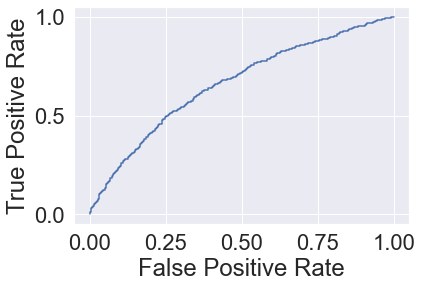

In [93]:
# Xgboost ROC Curve
from sklearn import metrics

y_pred_proba_xgb = best_xgb.predict_proba(X_test)[:,1]
fpr_xgb, tpr_xgb, thr_xgb = metrics.roc_curve(y_test,  y_pred_proba_xgb)

plt.plot(fpr_xgb,tpr_xgb)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [94]:
#0.657
metrics.roc_auc_score(y_test, y_pred_proba_xgb)

0.6599338436466307

In [95]:
g_mean_xgb = []
for tp, fp, th in zip(fpr_xgb[1:], tpr_xgb[1:], thr_xgb[1:]):
    g_mean = np.sqrt(tp*(1-fp))
    g_mean_xgb.append((th, g_mean))

Text(0, 0.5, 'gmean_xgb')

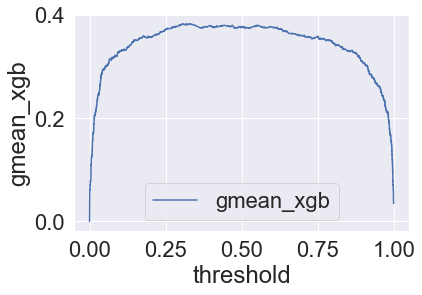

In [96]:
g_mean_xgb = pd.DataFrame(g_mean_xgb, columns=["threshold", "gmean_xgb"])
g_mean_xgb.plot(x='threshold', y='gmean_xgb')
plt.xlabel("threshold")
plt.ylabel("gmean_xgb")

In [97]:
best_xgb_threshold = g_mean_xgb.loc[g_mean_xgb["gmean_xgb"].argmax(), 'threshold']

In [98]:
y_pred_proba_xgb

array([0.01520233, 0.90018296, 0.43090755, ..., 0.9891145 , 0.58919924,
       0.9960389 ], dtype=float32)

In [99]:
y_pred_xgb

array([0, 1, 0, ..., 1, 1, 1])

In [100]:
best_xgb_threshold

0.31889215

In [101]:
y_pred_xgb_boolean = y_pred_proba_xgb > best_xgb_threshold

In [102]:
y_pred_xgb_boolean

array([False,  True,  True, ...,  True,  True,  True])

<AxesSubplot:>

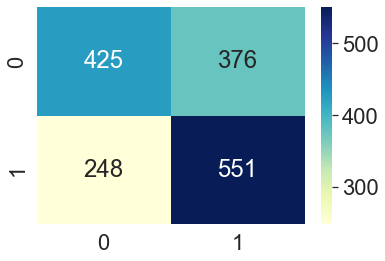

In [103]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
sns.set(font_scale=2)
sns.heatmap(confusion_matrix(y_test, y_pred_xgb_boolean), cmap="YlGnBu", annot=True, fmt="d")

In [104]:
from sklearn.metrics import f1_score

for threshold in np.arange(0.1, 0.9, 0.1):
    print(f'F1 Score at thresh {threshold}: {f1_score(y_test, (y_pred_proba_xgb > threshold)*1)}')

F1 Score at thresh 0.1: 0.6693386773547094
F1 Score at thresh 0.2: 0.6630669546436284
F1 Score at thresh 0.30000000000000004: 0.6410550458715597
F1 Score at thresh 0.4: 0.6350540216086434
F1 Score at thresh 0.5: 0.6171428571428571
F1 Score at thresh 0.6: 0.5911528150134048
F1 Score at thresh 0.7000000000000001: 0.5696022727272727
F1 Score at thresh 0.8: 0.5100775193798449


### Now, we will do the same but this time we will choose the columns with an ethic approach to obtain the best results, first we will remove the gender column

In [106]:
#No gender
columns_to_keep = ['NAME_CONTRACT_TYPE', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 
                   'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
                   'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 
                   'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 
                   'DAYS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'REGION_RATING_CLIENT', 
                   'REGION_RATING_CLIENT_W_CITY', 'ORGANIZATION_TYPE', 'TARGET', 'EXT_SOURCE_2', 
                   'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK', 
                   'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR', 
                   'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 
                   'DEF_60_CNT_SOCIAL_CIRCLE']

In [107]:
df_ethic = app_train[columns_to_keep]

In [108]:
df_ethic = df_ethic.dropna()

In [109]:
df_ethic.shape

(181720, 35)

In [110]:
df_ethic['TARGET'].value_counts()

0    166428
1     15292
Name: TARGET, dtype: int64

In [111]:
y_client_difficulties = df_ethic[df_ethic['TARGET'] == 1].index

In [112]:
y_good_client = df_ethic[df_ethic['TARGET'] == 0].index

In [113]:
df_ethic_res = pd.concat((df_ethic.loc[y_good_client].sample(5000, random_state=42), df_ethic.loc[y_client_difficulties].sample(5000, random_state=42)), axis=0)

In [114]:
y_eth = df_ethic_res['TARGET']

In [115]:
df_ethic_res = df_ethic_res.drop(['TARGET'], axis = 1)

In [116]:
df_ethic_is_categorical = df_ethic_res.dtypes==object

In [117]:
df_eth_categorical = df_ethic_res.columns[df_ethic_is_categorical].tolist()

In [118]:
df_eth_cat = df_ethic_res[df_eth_categorical]

In [119]:
df_eth_1hot = cat_encoder.fit_transform(df_eth_cat)

In [120]:
df_eth_numerical = [i for i in df_ethic_res.columns if i not in df_eth_categorical]

In [121]:
df_eth_num = df_ethic_res[df_eth_numerical]

In [122]:
df_eth_scaled = scaler.fit_transform(df_eth_num)

In [123]:
df_eth_prepared = np.hstack([df_eth_scaled, df_eth_1hot])

In [124]:
pca_eth = PCA(n_components=83)
pca_eth.fit(df_eth_prepared)
print(pca_eth.explained_variance_ratio_.cumsum())

[0.11955564 0.20613963 0.28386843 0.34024659 0.38930302 0.43505422
 0.47614795 0.51542561 0.55135384 0.58703412 0.61982968 0.65139182
 0.68169226 0.71139315 0.73849147 0.76474514 0.78907967 0.81202429
 0.83383455 0.84954713 0.86423872 0.87773856 0.88884718 0.89900514
 0.90836602 0.91698003 0.92380498 0.92956355 0.93462209 0.93928774
 0.94373478 0.94811942 0.95189663 0.95524871 0.95827843 0.96123531
 0.96377374 0.96597143 0.96792741 0.96976777 0.97156617 0.9732131
 0.97476001 0.97629618 0.97764776 0.97894518 0.98013022 0.98124937
 0.98232127 0.98334342 0.98428659 0.98521196 0.98608873 0.98692601
 0.98766805 0.98840828 0.98906926 0.98965048 0.99022472 0.99073117
 0.9912198  0.99169717 0.9921692  0.99259858 0.99300906 0.99337544
 0.99372819 0.99407516 0.99441734 0.99475045 0.9950731  0.99538921
 0.9956948  0.99598517 0.9962623  0.99652774 0.99678029 0.99702812
 0.99726419 0.99748191 0.99767354 0.99785397 0.99803085]


In [125]:
pca_eth_2 = PCA(n_components=24)
df_eth_reduced = pca_eth_2.fit_transform(df_eth_prepared)
print(pca_eth_2.explained_variance_ratio_.cumsum())
df_eth_reduced.shape

[0.11955564 0.20613963 0.28386843 0.34024659 0.38930302 0.43505422
 0.47614795 0.51542561 0.55135384 0.58703412 0.61982968 0.65139182
 0.68169226 0.71139315 0.73849147 0.76474514 0.78907967 0.81202429
 0.83383455 0.84954712 0.8642387  0.87773851 0.88884706 0.89900473]


(10000, 24)

In [126]:
X_train, X_val, y_train, y_val = train_test_split(df_eth_reduced, y_eth, test_size=0.2, random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

In [127]:
from sklearn.model_selection import RandomizedSearchCV

xgb_model = xgb.XGBClassifier(use_label_encoder=False)

xgb_randomized_eth = RandomizedSearchCV(estimator = xgb_model, param_distributions =parameters, n_iter = 30, cv = 3, 
                               verbose=2, random_state=42, n_jobs = -1, scoring='roc_auc')

%time xgb_randomized_eth.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_val, y_val)])

Fitting 3 folds for each of 30 candidates, totalling 90 fits
[CV] END ...........eta=0.25, max_depth=77, n_estimators=638; total time= 1.1min
[22:02:24] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	validation_0-logloss:0.59835	validation_1-logloss:0.68846
[CV] END ............eta=0.3, max_depth=66, n_estimators=694; total time=  57.8s
[22:02:24] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	validation_0-logloss:0.59835	validation_1-logloss:0.68846
[CV] END ...........eta=0.25, max_depth=77, n_estimators=638; total time= 1.1min
[22:02:24] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.

RandomizedSearchCV(cv=3,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           enable_categorical=False, gamma=None,
                                           gpu_id=None, importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate=None,
                                           max_delta_step=None, max_depth=None,
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints...
                                           reg_alpha=None, reg_lambda=None,
                                           scale_pos_weight=None,
                                           subsample=None, tree_method=None,
                                           use_label_encoder=False,
                                           validate_parameters=None,
                                           verbosity=None),
                   n_iter=30, n_jobs=-1,
                   param_distributions={'eta': [0.2, 0.25, 0.3],
                                        'max_depth': [50, 55, 61, 66, 72, 77,
                                                      83, 88, 94, 100],
                                        'n_estimators': [250, 305, 361, 416,
                                                         472, 527, 583, 638,
                                                         694, 750]},
                   random_state=42, scoring='roc_auc', verbose=2)

In [128]:
best_xgb_eth = xgb_randomized_eth.best_estimator_
best_xgb_eth

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              eta=0.25, gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.25, max_delta_step=0,
              max_depth=77, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=361, n_jobs=8,
              num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', use_label_encoder=False,
              validate_parameters=1, verbosity=None)

In [129]:
y_pred_xgb_eth = best_xgb_eth.predict(X_test)

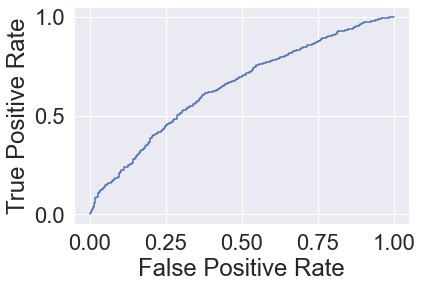

In [130]:
y_pred_proba_xgb_eth = best_xgb_eth.predict_proba(X_test)[:,1]
fpr_xgb_eth, tpr_xgb_eth, thr_xgb_eth = metrics.roc_curve(y_test,  y_pred_proba_xgb_eth)

plt.plot(fpr_xgb_eth,tpr_xgb_eth)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [131]:
metrics.roc_auc_score(y_test, y_pred_proba_xgb_eth)

0.6440056937588965

In [132]:
g_mean_xgb_eth = []
for tp, fp, th in zip(fpr_xgb_eth[1:], tpr_xgb_eth[1:], thr_xgb_eth[1:]):
    g_mean = np.sqrt(tp*(1-fp))
    g_mean_xgb_eth.append((th, g_mean))

Text(0, 0.5, 'gmean_xgb_eth')

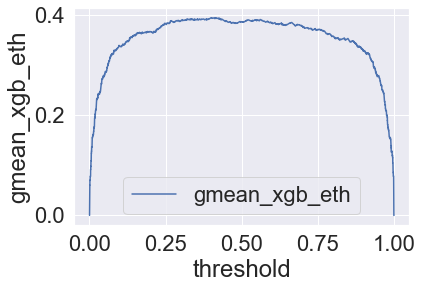

In [133]:
g_mean_xgb_eth = pd.DataFrame(g_mean_xgb_eth, columns=["threshold", "gmean_xgb_eth"])
g_mean_xgb_eth.plot(x='threshold', y='gmean_xgb_eth')
plt.xlabel("threshold")
plt.ylabel("gmean_xgb_eth")

In [134]:
best_xgb_threshold_eth = g_mean_xgb_eth.loc[g_mean_xgb_eth["gmean_xgb_eth"].argmax(), 'threshold']

In [135]:
y_pred_xgb_boolean_eth = y_pred_proba_xgb_eth > best_xgb_threshold_eth

<AxesSubplot:>

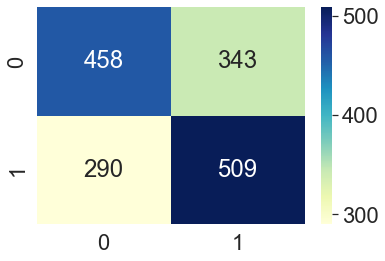

In [136]:
sns.heatmap(confusion_matrix(y_test, y_pred_xgb_boolean_eth), cmap="YlGnBu", annot=True, fmt="d")

In [137]:
from sklearn.metrics import recall_score

for threshold in np.arange(0.1, 0.9, 0.1):
    print(f'Recall Score at thresh {threshold}: {recall_score(y_test, (y_pred_proba_xgb_eth > threshold)*1)}')


Recall Score at thresh 0.1: 0.8335419274092616
Recall Score at thresh 0.2: 0.7634543178973717
Recall Score at thresh 0.30000000000000004: 0.690863579474343
Recall Score at thresh 0.4: 0.6370463078848561
Recall Score at thresh 0.5: 0.5919899874843555
Recall Score at thresh 0.6: 0.5356695869837297
Recall Score at thresh 0.7000000000000001: 0.4643304130162703
Recall Score at thresh 0.8: 0.4030037546933667


In [138]:
from sklearn.metrics import f1_score

for threshold in np.arange(0.1, 0.9, 0.1):
    print(f'F1 Score at thresh {threshold}: {f1_score(y_test, (y_pred_proba_xgb_eth > threshold)*1)}')

F1 Score at thresh 0.1: 0.6607142857142856
F1 Score at thresh 0.2: 0.6545064377682405
F1 Score at thresh 0.30000000000000004: 0.6326647564469914
F1 Score at thresh 0.4: 0.616596002422774
F1 Score at thresh 0.5: 0.6040868454661559
F1 Score at thresh 0.6: 0.5775978407557355
F1 Score at thresh 0.7000000000000001: 0.5365148228488793
F1 Score at thresh 0.8: 0.4980665119876257


In [139]:
f1_score(y_test, y_pred_xgb_eth)

0.6040868454661559

### Now, we will do the same but this time we will choose the columns with an ethic approach to obtain the best results, now we will remove the city/region rating column

In [175]:
#No city/region column
columns_to_keep = ['NAME_CONTRACT_TYPE', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 
                   'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
                   'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 
                   'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 
                   'DAYS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 
                   'ORGANIZATION_TYPE', 'TARGET', 'EXT_SOURCE_2', 
                   'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK', 
                   'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR', 
                   'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 
                   'DEF_60_CNT_SOCIAL_CIRCLE','CODE_GENDER']

In [176]:
df_city = app_train[columns_to_keep]

In [177]:
df_city = df_city.dropna()

In [178]:
df_city.shape

(181720, 34)

In [179]:
df_city['TARGET'].value_counts()

0    166428
1     15292
Name: TARGET, dtype: int64

In [180]:
y_client_difficulties = df_city[df_city['TARGET'] == 1].index

In [181]:
y_good_client = df_city[df_city['TARGET'] == 0].index

In [182]:
df_city_res = pd.concat((df_city.loc[y_good_client].sample(5000, random_state=42), df_city.loc[y_client_difficulties].sample(5000, random_state=42)), axis=0)

In [183]:
y_city = df_city_res['TARGET']

In [184]:
df_city_res = df_city_res.drop(['TARGET'], axis = 1)

In [185]:
df_city_is_categorical = df_city_res.dtypes==object

In [186]:
df_city_categorical = df_city_res.columns[df_city_is_categorical].tolist()

In [187]:
df_city_cat = df_city_res[df_city_categorical]

In [188]:
df_city_1hot = cat_encoder.fit_transform(df_city_cat)

In [189]:
df_city_numerical = [i for i in df_city_res.columns if i not in df_city_categorical]

In [190]:
df_city_num = df_city_res[df_city_numerical]

In [191]:
df_city_scaled = scaler.fit_transform(df_city_num)

In [192]:
df_city_prepared = np.hstack([df_city_scaled, df_city_1hot])

In [193]:
pca_city = PCA(n_components=83)
pca_city.fit(df_city_prepared)
print(pca_eth.explained_variance_ratio_.cumsum())

[0.11955564 0.20613963 0.28386843 0.34024659 0.38930302 0.43505422
 0.47614795 0.51542561 0.55135384 0.58703412 0.61982968 0.65139182
 0.68169226 0.71139315 0.73849147 0.76474514 0.78907967 0.81202429
 0.83383455 0.84954713 0.86423872 0.87773856 0.88884718 0.89900514
 0.90836602 0.91698003 0.92380498 0.92956355 0.93462209 0.93928774
 0.94373478 0.94811942 0.95189663 0.95524871 0.95827843 0.96123531
 0.96377374 0.96597143 0.96792741 0.96976777 0.97156617 0.9732131
 0.97476001 0.97629618 0.97764776 0.97894518 0.98013022 0.98124937
 0.98232127 0.98334342 0.98428659 0.98521196 0.98608873 0.98692601
 0.98766805 0.98840828 0.98906926 0.98965048 0.99022472 0.99073117
 0.9912198  0.99169717 0.9921692  0.99259858 0.99300906 0.99337544
 0.99372819 0.99407516 0.99441734 0.99475045 0.9950731  0.99538921
 0.9956948  0.99598517 0.9962623  0.99652774 0.99678029 0.99702812
 0.99726419 0.99748191 0.99767354 0.99785397 0.99803085]


In [194]:
pca_city_2 = PCA(n_components=24)
df_city_reduced = pca_city_2.fit_transform(df_city_prepared)
print(pca_city_2.explained_variance_ratio_.cumsum())
df_city_reduced.shape

[0.11655711 0.20797598 0.26869189 0.32055038 0.3689494  0.41379421
 0.45722129 0.4984705  0.53615969 0.57254636 0.60720108 0.64100433
 0.673255   0.70442236 0.73395024 0.76142342 0.78709657 0.81119879
 0.83249422 0.84833801 0.86281405 0.87523184 0.88635162 0.89696101]


(10000, 24)

In [195]:
X_train, X_val, y_train, y_val = train_test_split(df_city_reduced, y_city, test_size=0.2, random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

In [196]:
from sklearn.model_selection import RandomizedSearchCV

xgb_model = xgb.XGBClassifier(use_label_encoder=False)

xgb_randomized_city = RandomizedSearchCV(estimator = xgb_model, param_distributions =parameters, n_iter = 30, cv = 3, 
                               verbose=2, random_state=42, n_jobs = -1, scoring='roc_auc')

%time xgb_randomized_city.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_val, y_val)])

Fitting 3 folds for each of 30 candidates, totalling 90 fits
[CV] END ............eta=0.3, max_depth=66, n_estimators=694; total time=  31.9s
[22:41:34] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	validation_0-logloss:0.59369	validation_1-logloss:0.68409
[CV] END ............eta=0.3, max_depth=66, n_estimators=694; total time=  46.3s
[22:41:34] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	validation_0-logloss:0.59431	validation_1-logloss:0.68036
[CV] END ............eta=0.3, max_depth=66, n_estimators=694; total time=  54.2s
[22:41:34] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.

RandomizedSearchCV(cv=3,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           enable_categorical=False, gamma=None,
                                           gpu_id=None, importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate=None,
                                           max_delta_step=None, max_depth=None,
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints...
                                           reg_alpha=None, reg_lambda=None,
                                           scale_pos_weight=None,
                                           subsample=None, tree_method=None,
                                           use_label_encoder=False,
                                           validate_parameters=None,
                                           verbosity=None),
                   n_iter=30, n_jobs=-1,
                   param_distributions={'eta': [0.2, 0.25, 0.3],
                                        'max_depth': [50, 55, 61, 66, 72, 77,
                                                      83, 88, 94, 100],
                                        'n_estimators': [250, 305, 361, 416,
                                                         472, 527, 583, 638,
                                                         694, 750]},
                   random_state=42, scoring='roc_auc', verbose=2)

In [198]:
y_pred_xgb_city = best_xgb_city.predict(X_test)

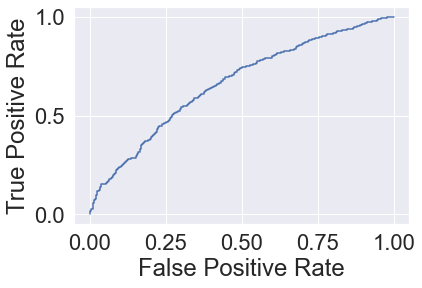

In [199]:
y_pred_proba_xgb_city = best_xgb_city.predict_proba(X_test)[:,1]
fpr_xgb_city, tpr_xgb_city, thr_xgb_city = metrics.roc_curve(y_test,  y_pred_proba_xgb_city)

plt.plot(fpr_xgb_city,tpr_xgb_city)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [200]:
metrics.roc_auc_score(y_test, y_pred_proba_xgb_city)

0.6607979074967305

In [201]:
g_mean_xgb_city = []
for tp, fp, th in zip(fpr_xgb_city[1:], tpr_xgb_city[1:], thr_xgb_city[1:]):
    g_mean = np.sqrt(tp*(1-fp))
    g_mean_xgb_city.append((th, g_mean))

Text(0, 0.5, 'gmean_xgb_city')

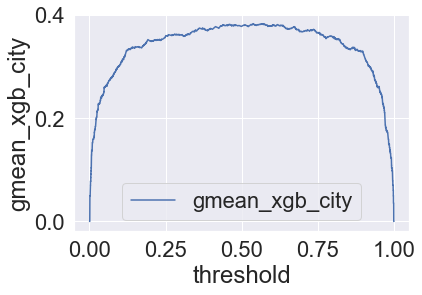

In [202]:
g_mean_xgb_city = pd.DataFrame(g_mean_xgb_city, columns=["threshold", "gmean_xgb_city"])
g_mean_xgb_city.plot(x='threshold', y='gmean_xgb_city')
plt.xlabel("threshold")
plt.ylabel("gmean_xgb_city")

In [203]:
best_xgb_threshold_city = g_mean_xgb_city.loc[g_mean_xgb_city["gmean_xgb_city"].argmax(), 'threshold']

In [204]:
y_pred_xgb_boolean_city = y_pred_proba_xgb_city > best_xgb_threshold_city

<AxesSubplot:>

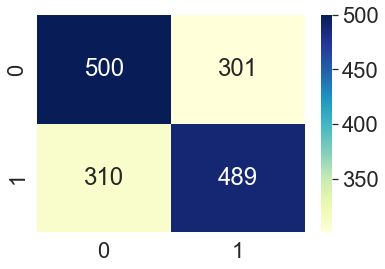

In [205]:
sns.heatmap(confusion_matrix(y_test, y_pred_xgb_boolean_city), cmap="YlGnBu", annot=True, fmt="d")

In [206]:
from sklearn.metrics import recall_score

for threshold in np.arange(0.1, 0.9, 0.1):
    print(f'Recall Score at thresh {threshold}: {recall_score(y_test, (y_pred_proba_xgb_city > threshold)*1)}')


Recall Score at thresh 0.1: 0.869837296620776
Recall Score at thresh 0.2: 0.7934918648310388
Recall Score at thresh 0.30000000000000004: 0.7471839799749687
Recall Score at thresh 0.4: 0.6846057571964956
Recall Score at thresh 0.5: 0.6332916145181476
Recall Score at thresh 0.6: 0.5732165206508135
Recall Score at thresh 0.7000000000000001: 0.5081351689612015
Recall Score at thresh 0.8: 0.41051314142678347


In [207]:
from sklearn.metrics import f1_score

for threshold in np.arange(0.1, 0.9, 0.1):
    print(f'F1 Score at thresh {threshold}: {f1_score(y_test, (y_pred_proba_xgb_city > threshold)*1)}')

F1 Score at thresh 0.1: 0.6737760542898692
F1 Score at thresh 0.2: 0.6659663865546217
F1 Score at thresh 0.30000000000000004: 0.6603982300884955
F1 Score at thresh 0.4: 0.6442873969375735
F1 Score at thresh 0.5: 0.6258503401360545
F1 Score at thresh 0.6: 0.5998690242305174
F1 Score at thresh 0.7000000000000001: 0.5702247191011236
F1 Score at thresh 0.8: 0.5046153846153846


In [208]:
f1_score(y_test, y_pred_xgb_city)

0.6258503401360545

[CV] END ...........eta=0.3, max_depth=100, n_estimators=527; total time=  43.3s
[CV] END ...........eta=0.3, max_depth=100, n_estimators=527; total time=  43.7s
[CV] END ...........eta=0.25, max_depth=77, n_estimators=638; total time=  50.0s
[CV] END ...........eta=0.25, max_depth=77, n_estimators=638; total time=  50.3s
[CV] END ...........eta=0.25, max_depth=77, n_estimators=638; total time=  47.4s
[CV] END ............eta=0.3, max_depth=66, n_estimators=694; total time=  44.3s
[CV] END ............eta=0.3, max_depth=66, n_estimators=694; total time=  38.1s
[CV] END ............eta=0.3, max_depth=66, n_estimators=694; total time=  26.9s
